# Arabic Poetry Classifier

In this notebook, we are going to build a simple classifier for classifying Arabic poetry into two classes: 

1. Modern poetry

2. Ancient poetry




## 1. Import libraries

In [2]:
import pandas as pd
import numpy as np 
import matplotlib.pyplot as plt

import csv
import re # for regular expression
import string
import nltk 
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.tokenize import RegexpTokenizer
from collections import Counter 
from tqdm import tqdm

from sklearn.preprocessing import LabelEncoder


from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split
from sklearn import svm
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import cross_val_score, cross_val_predict, KFold
from sklearn.metrics  import confusion_matrix, classification_report, accuracy_score, roc_curve, auc

%matplotlib inline

In [3]:
np.random.seed(123)

## 2. Read and explore data

In [4]:
df_poems = pd.read_csv('all_poems.csv') 
df_poems.head()

,poem_id,poem_link,poem_style,poem_text,poem_title,poet_cat,poet_id,poet_link,poet_name
0,21,http://www.adab.com/modules.php?name=Sh3er&doW...,فصحى,عيناك غابتا نخيل ساعة السحر او شرفتان راح يناي...,أنشودة المطر,العراق,2,http://www.adab.com/modules.php?name=Sh3er&doW...,بدر شاكر السياب
1,65546,http://www.adab.com/modules.php?name=Sh3er&doW...,فصحى,انا لا ازال و في يدي قدحي ياليل اين تفرق الشر...,أقداح و أحلام,العراق,2,http://www.adab.com/modules.php?name=Sh3er&doW...,بدر شاكر السياب
2,65561,http://www.adab.com/modules.php?name=Sh3er&doW...,فصحى,علي مقلتيك ارتشفت النجوم وعانقت امالي الايبة ...,هوى واحد !,العراق,2,http://www.adab.com/modules.php?name=Sh3er&doW...,بدر شاكر السياب
3,65554,http://www.adab.com/modules.php?name=Sh3er&doW...,فصحى,اساطير من حشرجات الزمان نسيج اليد البالية رواه...,أساطير,العراق,2,http://www.adab.com/modules.php?name=Sh3er&doW...,بدر شاكر السياب
4,65550,http://www.adab.com/modules.php?name=Sh3er&doW...,فصحى,والتف حولك ساعداي ومال جيدك في اشتهاء كالزهرة ...,اللقاء الأخير,العراق,2,http://www.adab.com/modules.php?name=Sh3er&doW...,بدر شاكر السياب


In [4]:
df_poems.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 58021 entries, 0 to 58020
Data columns (total 9 columns):
poem_id       58021 non-null int64
poem_link     58021 non-null object
poem_style    58021 non-null object
poem_text     58020 non-null object
poem_title    58021 non-null object
poet_cat      58021 non-null object
poet_id       58021 non-null int64
poet_link     58021 non-null object
poet_name     58021 non-null object
dtypes: int64(2), object(7)
memory usage: 4.0+ MB


In [5]:
# Print a poem
df_poems.loc[10,'poem_text']

' هبت تغمغم سوف نفترق روح علي شفتيك تحترق صوت كان ضرام صاعقة ينداح فيه وقلبي الافق ضاق الفضاء وغام في بصري ضوء النجوم وحطم الالق فعلي جفوني الشاحبات وفي دمعي شظايا منه او مزق فيم الفراق اليس يجمعنا حب نظل عليه نعتنق حب ترقرق في الوعود سنا منه ورف علي الخطي عبق * اختاه صمتك ملءه الريب فيما الفراق اما له سب الحزن في عينيك مرتجف والياس في شفتيك يضطرب ويداك باردتان مثل غدي وعلي جبينك خاطر شجب ما زال سرك لا تجنحه اه مءجة ولا يثب حتي ضجرت به واسامه طول الثواء واده التعب اني اخاف عليك واختلجت شفة الي القبلات تلتهب * ثم انثنيت مهيضة الجلد تنهدين وتعصرين يدي وتردين وانت ذاهلة اني اخاف عليك حزن غد فتكاد نتثرالنجوم اسي في جوهن كذاءب البرد لا تركي لا تركي لغدي تعكير يومي ما يكون غدي واذا ابتسمت اليوم من فرح فلتعبسن ملامح الابد ما كان عمري قبل موعدنا الا السنين تدب في جسد * اختاه لذ علي الهوي المي فاستمتعي بهواك وابتسمي هاتي الهيب فلست ارهبه ما كان حبك اول الحم ما زلت محترقا تلقفني نار من الاوهام كالظلم سوداء لا نور يضيء بها كرقاد حمي دونما حلم هاتي لهيبك ان فيه سنا يهدي خطاي ولو الي العدم هي ومضة 

## 3. Clean data  
#### 3.1 If the 'poem_text' is null, drop the entire row.

In [6]:
df_poems[df_poems['poem_text'].isnull() == True]

,poem_id,poem_link,poem_style,poem_text,poem_title,poet_cat,poet_id,poet_link,poet_name
2454,6200,http://www.adab.com/modules.php?name=Sh3er&doW...,فصحى,NaN,الأشباح,البحرين,68,http://www.adab.com/modules.php?name=Sh3er&doW...,قاسم حداد


In [7]:
df_poems = df_poems.dropna()

#### 3.2 Remove any  'عامي' poem

In [8]:
df_poems.poem_style.value_counts()

فصحى    57893
عامي       94
-          33
Name: poem_style, dtype: int64

In [9]:
df_poems.drop(df_poems[df_poems.poem_style == 'عامي'].index, axis = 0, inplace=True)

df_poems.poem_style.value_counts()

فصحى    57893
-          33
Name: poem_style, dtype: int64

#### 3.3 Remove unnecessary columns

In [10]:
df_poems.drop(['poem_link', 'poet_link', 'poem_style'], axis = 1, inplace=True)

#### 3.4 Check if there is any duplicate in the 'poem_text' column

In [114]:
# Number of unique values 
df_poems.poem_text.nunique()

57599

In [9]:
# Show duplicate rows
df_poems[df_poems.duplicated(subset = ['poem_text'], keep=False) == True].head()

,poem_id,poem_text,poem_title,poet_cat,poet_id,poet_name
407,68884,ليس في وسعك يا سيدتي ان تصلحيني فلقد فات القطا...,تَشَبُّث,سوريا,7,نزار قباني
636,68900,ليس في وسعك يا سيدتي ان تصلحيني فلقد فات القطا...,تصميم,سوريا,7,نزار قباني
1365,67907,تلك المنازل كيف حال مقيمها انا قنعنا بعدها بر...,تلك المنازل,لبنان,31,إيليا أبو ماضي
1383,67926,تلك المنازل كيف حال مقيمها انا قنعنا بعدها بر...,تلك المنازل,لبنان,31,إيليا أبو ماضي
1773,66919,ذلك الرجل الذي استطاع اقتحام ملكتي علي صهوة رس...,اشهد برجل على صهوة رسالة.,سوريا,35,غادة السمان


In [160]:
# Drop duplicates
df_poems.drop_duplicates(subset = ['poem_text'], keep='first', inplace=True)
df_poems.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 57599 entries, 0 to 58020
Data columns (total 6 columns):
poem_id       57599 non-null int64
poem_text     57599 non-null object
poem_title    57599 non-null object
poet_cat      57599 non-null object
poet_id       57599 non-null int64
poet_name     57599 non-null object
dtypes: int64(2), object(4)
memory usage: 3.1+ MB


## 4. Preprocess the data

#### 4.1 Remove punctuations and numbers

In [10]:
# remove punctuations

arabic_punctuations = '''`÷×؛<>_()*&^%][ـ،/:"؟.,'{}~¦+|!”…“–ـ'''

def remove_punctuations(text):
    translator = str.maketrans('', '', arabic_punctuations)
    return text.translate(translator)


df_poems['poem_text'] = df_poems['poem_text'].apply(lambda x: remove_punctuations(x))


In [11]:
numbers = '،؛؟”0123456789“'

def remove_numbers(text):
    translator = str.maketrans('', '', numbers)
    return text.translate(translator)


df_poems['poem_text'] = df_poems['poem_text'].apply(lambda x: remove_numbers(x))



#### 4.2 Normalize letters

In [119]:
# We can skip this step for better analysis

def normalize_arabic(text):
    
    text = re.sub("[إأآا]", "ا", text)
    text = re.sub("ى", "ي", text)
    text = re.sub("ة", "ه", text)
    text = re.sub("گ", "ك", text)
    text = re.sub("ؤ", "و", text)

    return text


df_poems['poem_text'] = df_poems['poem_text'].apply(lambda x: normalize_arabic(x))



In [120]:
df_poems.head()

,poem_id,poem_text,poem_title,poet_cat,poet_id,poet_name
0,21,عيناك غابتا نخيل ساعه السحر او شرفتان راح يناي...,أنشودة المطر,العراق,2,بدر شاكر السياب
1,65546,انا لا ازال و في يدي قدحي ياليل اين تفرق الشر...,أقداح و أحلام,العراق,2,بدر شاكر السياب
2,65561,علي مقلتيك ارتشفت النجوم وعانقت امالي الايبه ...,هوى واحد !,العراق,2,بدر شاكر السياب
3,65554,اساطير من حشرجات الزمان نسيج اليد الباليه رواه...,أساطير,العراق,2,بدر شاكر السياب
4,65550,والتف حولك ساعداي ومال جيدك في اشتهاء كالزهره ...,اللقاء الأخير,العراق,2,بدر شاكر السياب


#### 4.3 Tokenization

In [12]:
# Split poem text into words
df_poems['poem_text'] = df_poems['poem_text'].str.split()
df_poems['poem_text'].head(10)

0    [عيناك, غابتا, نخيل, ساعة, السحر, او, شرفتان, ...
1    [انا, لا, ازال, و, في, يدي, قدحي, ياليل, اين, ...
2    [علي, مقلتيك, ارتشفت, النجوم, وعانقت, امالي, ا...
3    [اساطير, من, حشرجات, الزمان, نسيج, اليد, البال...
4    [والتف, حولك, ساعداي, ومال, جيدك, في, اشتهاء, ...
5    [اطلي, علي, طرفي, الدامع, خيالا, من, الكوكب, ا...
6    [اتبعيني, فالضحي, رانت, به, الذكري, علي, شط, ب...
7    [الداء, يثلج, راحتي, ويطفء, الغد, في, خيالي, و...
8    [سوف, امضي, اسمع, الريح, تناديني, بعيدا, في, ظ...
9    [--, اليل, والسوق, القديم, خفت, به, الاصوات, ا...
Name: poem_text, dtype: object

#### 4.4 Stemming 
Words are reduced to a root by removing inflection through dropping unnecessary characters.

In [17]:
# Using Stemmer

import nltk
from nltk.stem.isri import ISRIStemmer
ISRIS_st = ISRIStemmer()


df_poems['poem_text'] = df_poems['poem_text'].apply(lambda x: [ISRIS_st.stem(item) for item in tqdm(x)])
    
df_poems['poem_text'].head()

100%|██████████| 16/16 [00:00<00:00, 24027.52it/s]


100%|██████████| 363/363 [00:00<00:00, 91071.44it/s]


100%|██████████| 179/179 [00:00<00:00, 77624.11it/s]


100%|██████████| 117/117 [00:00<00:00, 72540.07it/s]


100%|██████████| 149/149 [00:00<00:00, 74808.63it/s]


100%|██████████| 51/51 [00:00<00:00, 43851.89it/s]


100%|██████████| 88/88 [00:00<00:00, 41448.48it/s]


100%|██████████| 440/440 [00:00<00:00, 90257.43it/s]


100%|██████████| 158/158 [00:00<00:00, 70410.12it/s]


100%|██████████| 172/172 [00:00<00:00, 63865.11it/s]


100%|██████████| 588/588 [00:00<00:00, 91760.64it/s]


100%|██████████| 219/219 [00:00<00:00, 86631.39it/s]


100%|██████████| 39/39 [00:00<00:00, 29596.14it/s]


100%|██████████| 52/52 [00:00<00:00, 46385.33it/s]


100%|██████████| 77/77 [00:00<00:00, 51093.40it/s]


100%|██████████| 26/26 [00:00<00:00, 29714.42it/s]


100%|██████████| 29/29 [00:00<00:00, 35617.81it/s]


100%|██████████| 117/117 [00:00<00:00, 69312.65it/s]


100%|██████████| 177/177 [00:00<00:00, 85009.94it/s]


100%|██████████| 31/31 [00:00<00:00, 31444.60it/s]


100%|██████████| 39/39 [00:00<00:00, 44354.08it/s]


100%|██████████| 41/41 [00:00<00:00, 55706.66it/s]


100%|██████████| 28/28 [00:00<00:00, 39489.08it/s]


100%|██████████| 145/145 [00:00<00:00, 42000.97it/s]


100%|██████████| 133/133 [00:00<00:00, 64060.91it/s]


100%|██████████| 14/14 [00:00<00:00, 24264.57it/s]


100%|██████████| 18/18 [00:00<00:00, 22753.91it/s]


100%|██████████| 571/571 [00:00<00:00, 100543.56it/s]


100%|██████████| 59/59 [00:00<00:00, 52584.77it/s]


100%|██████████| 38/38 [00:00<00:00, 35481.65it/s]


100%|██████████| 13/13 [00:00<00:00, 23512.70it/s]


100%|██████████| 41/41 [00:00<00:00, 35493.59it/s]


100%|██████████| 33/33 [00:00<00:00, 31826.17it/s]


100%|██████████| 265/265 [00:00<00:00, 93670.20it/s]


100%|██████████| 39/39 [00:00<00:00, 36858.46it/s]


100%|██████████| 15/15 [00:00<00:00, 18251.98it/s]


100%|██████████| 169/169 [00:00<00:00, 72315.59it/s]


100%|██████████| 173/173 [00:00<00:00, 74759.39it/s]


100%|██████████| 21/21 [00:00<00:00, 19405.24it/s]


100%|██████████| 34/34 [00:00<00:00, 37706.59it/s]


100%|██████████| 165/165 [00:00<00:00, 90702.51it/s]


100%|██████████| 798/798 [00:00<00:00, 104667.41it/s]


100%|██████████| 32/32 [00:00<00:00, 54782.75it/s]


100%|██████████| 117/117 [00:00<00:00, 66522.10it/s]


100%|██████████| 194/194 [00:00<00:00, 96937.69it/s]


100%|██████████| 145/145 [00:00<00:00, 89793.90it/s]


100%|██████████| 51/51 [00:00<00:00, 41399.17it/s]


100%|██████████| 15/15 [00:00<00:00, 19966.54it/s]


100%|██████████| 41/41 [00:00<00:00, 34365.80it/s]


100%|██████████| 444/444 [00:00<00:00, 90793.77it/s]
0it [00:00, ?it/s]
100%|██████████| 287/287 [00:00<00:00, 57629.51it/s]


100%|██████████| 17/17 [00:00<00:00, 22219.75it/s]


100%|██████████| 20/20 [00:00<00:00, 31000.03it/s]


100%|██████████| 724/724 [00:00<00:00, 97102.17it/s]


100%|██████████| 511/511 [00:00<00:00, 98176.42it/s]


100%|██████████| 31/31 [00:00<00:00, 37001.54it/s]


100%|██████████| 172/172 [00:00<00:00, 85193.70it/s]


100%|██████████| 57/57 [00:00<00:00, 63804.46it/s]


100%|██████████| 8/8 [00:00<00:00, 16328.19it/s]


100%|██████████| 196/196 [00:00<00:00, 68598.43it/s]


100%|██████████| 19/19 [00:00<00:00, 33455.83it/s]


100%|██████████| 19/19 [00:00<00:00, 28060.48it/s]


100%|██████████| 18/18 [00:00<00:00, 22356.37it/s]


100%|██████████| 313/313 [00:00<00:00, 61120.96it/s]


100%|██████████| 17/17 [00:00<00:00, 23030.74it/s]


100%|██████████| 19/19 [00:00<00:00, 28522.47it/s]


100%|██████████| 96/96 [00:00<00:00, 37035.80it/s]


100%|██████████| 38/38 [00:00<00:00, 26626.05it/s]


100%|██████████| 120/120 [00:00<00:00, 67795.86it/s]


100%|██████████| 18/18 [00:00<00:00, 32968.33it/s]


100%|██████████| 23/23 [00:00<00:00, 26999.44it/s]


100%|██████████| 22/22 [00:00<00:00, 34965.78it/s]


100%|██████████| 70/70 [00:00<00:00, 53518.28it/s]


100%|██████████| 207/207 [00:00<00:00, 86107.40it/s]


100%|██████████| 24/24 [00:00<00:00, 29051.46it/s]


100%|██████████| 124/124 [00:00<00:00, 74651.03it/s]


100%|██████████| 26/26 [00:00<00:00, 23217.35it/s]


100%|██████████| 89/89 [00:00<00:00, 79238.60it/s]


100%|██████████| 45/45 [00:00<00:00, 53453.32it/s]


100%|██████████| 21/21 [00:00<00:00, 33325.91it/s]


100%|██████████| 20/20 [00:00<00:00, 19920.70it/s]


100%|██████████| 41/41 [00:00<00:00, 41338.09it/s]


100%|██████████| 72/72 [00:00<00:00, 67847.65it/s]


100%|██████████| 81/81 [00:00<00:00, 49416.53it/s]


100%|██████████| 18/18 [00:00<00:00, 23778.73it/s]


100%|██████████| 23/23 [00:00<00:00, 31464.12it/s]


100%|██████████| 35/35 [00:00<00:00, 32349.19it/s]


100%|██████████| 18/18 [00:00<00:00, 28532.68it/s]


100%|██████████| 10/10 [00:00<00:00, 15403.25it/s]


100%|██████████| 48/48 [00:00<00:00, 49539.02it/s]


100%|██████████| 132/132 [00:00<00:00, 76693.19it/s]


100%|██████████| 243/243 [00:00<00:00, 76852.35it/s]


100%|██████████| 40/40 [00:00<00:00, 40890.12it/s]


100%|██████████| 115/115 [00:00<00:00, 55238.77it/s]


100%|██████████| 48/48 [00:00<00:00, 47482.69it/s]


100%|██████████| 14/14 [00:00<00:00, 17225.07it/s]


100%|██████████| 179/179 [00:00<00:00, 88275.18it/s]


100%|██████████| 19/19 [00:00<00:00, 20720.69it/s]


100%|██████████| 14/14 [00:00<00:00, 25586.17it/s]


100%|██████████| 184/184 [00:00<00:00, 64318.02it/s]


100%|██████████| 147/147 [00:00<00:00, 90114.39it/s]


100%|██████████| 65/65 [00:00<00:00, 55889.66it/s]


100%|██████████| 19/19 [00:00<00:00, 27498.89it/s]


100%|██████████| 26/26 [00:00<00:00, 32787.70it/s]


100%|██████████| 10/10 [00:00<00:00, 14905.13it/s]


100%|██████████| 414/414 [00:00<00:00, 78366.36it/s]


100%|██████████| 27/27 [00:00<00:00, 36531.03it/s]


100%|██████████| 439/439 [00:00<00:00, 109941.45it/s]


100%|██████████| 57/57 [00:00<00:00, 64336.74it/s]


100%|██████████| 39/39 [00:00<00:00, 28607.53it/s]


100%|██████████| 62/62 [00:00<00:00, 50445.56it/s]


100%|██████████| 627/627 [00:00<00:00, 109617.30it/s]


100%|██████████| 14/14 [00:00<00:00, 21877.89it/s]


100%|██████████| 20/20 [00:00<00:00, 30077.48it/s]


100%|██████████| 64/64 [00:00<00:00, 45137.96it/s]


100%|██████████| 31/31 [00:00<00:00, 36502.93it/s]


100%|██████████| 29/29 [00:00<00:00, 37049.90it/s]


100%|██████████| 25/25 [00:00<00:00, 31366.32it/s]


100%|██████████| 384/384 [00:00<00:00, 102021.46it/s]


100%|██████████| 88/88 [00:00<00:00, 50721.28it/s]


100%|██████████| 66/66 [00:00<00:00, 36709.20it/s]


100%|██████████| 243/243 [00:00<00:00, 41137.22it/s]


100%|██████████| 148/148 [00:00<00:00, 63245.75it/s]


100%|██████████| 57/57 [00:00<00:00, 76090.17it/s]


100%|██████████| 602/602 [00:00<00:00, 87690.87it/s]


100%|██████████| 635/635 [00:00<00:00, 96433.00it/s]


100%|██████████| 251/251 [00:00<00:00, 88572.30it/s]


100%|██████████| 79/79 [00:00<00:00, 50672.89it/s]


100%|██████████| 33/33 [00:00<00:00, 34917.26it/s]


100%|██████████| 74/74 [00:00<00:00, 53010.84it/s]


100%|██████████| 107/107 [00:00<00:00, 61587.83it/s]


100%|██████████| 19/19 [00:00<00:00, 32211.71it/s]


100%|██████████| 126/126 [00:00<00:00, 58798.65it/s]


100%|██████████| 358/358 [00:00<00:00, 82872.17it/s]


100%|██████████| 32/32 [00:00<00:00, 37596.00it/s]


100%|██████████| 446/446 [00:00<00:00, 77688.42it/s]


100%|██████████| 493/493 [00:00<00:00, 92951.18it/s]


100%|██████████| 147/147 [00:00<00:00, 83049.93it/s]


100%|██████████| 91/91 [00:00<00:00, 85848.33it/s]


100%|██████████| 69/69 [00:00<00:00, 72788.47it/s]


100%|██████████| 22/22 [00:00<00:00, 15647.73it/s]


100%|██████████| 47/47 [00:00<00:00, 46112.82it/s]


100%|██████████| 41/41 [00:00<00:00, 61002.65it/s]


100%|██████████| 153/153 [00:00<00:00, 84997.15it/s]


100%|██████████| 68/68 [00:00<00:00, 48929.95it/s]


100%|██████████| 325/325 [00:00<00:00, 46891.94it/s]


100%|██████████| 43/43 [00:00<00:00, 45950.34it/s]


100%|██████████| 107/107 [00:00<00:00, 50471.27it/s]


100%|██████████| 38/38 [00:00<00:00, 27922.84it/s]


100%|██████████| 14/14 [00:00<00:00, 26308.36it/s]


100%|██████████| 245/245 [00:00<00:00, 82439.19it/s]


100%|██████████| 286/286 [00:00<00:00, 97320.38it/s]


100%|██████████| 66/66 [00:00<00:00, 55800.05it/s]


100%|██████████| 79/79 [00:00<00:00, 49381.52it/s]


100%|██████████| 592/592 [00:00<00:00, 105692.25it/s]


100%|██████████| 118/118 [00:00<00:00, 36827.73it/s]


100%|██████████| 58/58 [00:00<00:00, 51150.05it/s]


100%|██████████| 187/187 [00:00<00:00, 79233.75it/s]


100%|██████████| 70/70 [00:00<00:00, 59881.97it/s]


100%|██████████| 41/41 [00:00<00:00, 70709.89it/s]


100%|██████████| 371/371 [00:00<00:00, 78364.65it/s]


100%|██████████| 204/204 [00:00<00:00, 56762.51it/s]


100%|██████████| 80/80 [00:00<00:00, 53328.72it/s]


100%|██████████| 236/236 [00:00<00:00, 68682.75it/s]


100%|██████████| 114/114 [00:00<00:00, 68887.86it/s]


100%|██████████| 227/227 [00:00<00:00, 59813.23it/s]


100%|██████████| 72/72 [00:00<00:00, 65692.82it/s]


100%|██████████| 129/129 [00:00<00:00, 43771.96it/s]


100%|██████████| 153/153 [00:00<00:00, 69256.26it/s]


100%|██████████| 293/293 [00:00<00:00, 87543.17it/s]


100%|██████████| 119/119 [00:00<00:00, 66179.02it/s]


100%|██████████| 256/256 [00:00<00:00, 77925.96it/s]


100%|██████████| 9/9 [00:00<00:00, 18715.29it/s]


100%|██████████| 155/155 [00:00<00:00, 72973.07it/s]


100%|██████████| 46/46 [00:00<00:00, 31551.59it/s]


100%|██████████| 173/173 [00:00<00:00, 87942.62it/s]


100%|██████████| 254/254 [00:00<00:00, 59764.01it/s]


100%|██████████| 66/66 [00:00<00:00, 47442.00it/s]


100%|██████████| 143/143 [00:00<00:00, 52844.53it/s]


100%|██████████| 151/151 [00:00<00:00, 74274.65it/s]


100%|██████████| 64/64 [00:00<00:00, 56548.44it/s]


100%|██████████| 161/161 [00:00<00:00, 72948.36it/s]


100%|██████████| 129/129 [00:00<00:00, 61666.88it/s]


100%|██████████| 36/36 [00:00<00:00, 37890.83it/s]


100%|██████████| 309/309 [00:00<00:00, 101978.12it/s]


100%|██████████| 364/364 [00:00<00:00, 94987.04it/s]


100%|██████████| 46/46 [00:00<00:00, 74206.92it/s]


0    [عين, غبت, نخل, سعة, سحر, او, شرف, راح, يني, ع...
1    [انا, لا, ازل, و, في, يدي, قدح, الل, اين, فرق,...
2    [علي, قلت, رشف, نجم, عنق, ملي, ايب, سبق, حتي, ...
3    [اطر, من, حشرج, زمن, نسج, الد, بلي, روا, ظلم, ...
4    [لتف, حول, سعد, ومل, جيد, في, شهء, زهر, وسن, ف...
Name: poem_text, dtype: object

#### 4.5 Remove stop-words

In [20]:
# Show the set of Arabic stop-words
stop = stopwords.words('arabic')

set(stopwords.words('arabic'))



{'آه',
 'آها',
 'آي',
 'أف',
 'أقل',
 'أكثر',
 'ألا',
 'أم',
 'أما',
 'أن',
 'أنا',
 'أنت',
 'أنتم',
 'أنتما',
 'أنتن',
 'أنى',
 'أو',
 'أولئك',
 'أولاء',
 'أوه',
 'أي',
 'أين',
 'أينما',
 'أيها',
 'إذ',
 'إذا',
 'إذما',
 'إذن',
 'إلا',
 'إلى',
 'إليك',
 'إليكم',
 'إليكما',
 'إليكن',
 'إما',
 'إن',
 'إنا',
 'إنما',
 'إنه',
 'إي',
 'إيه',
 'التي',
 'الذي',
 'الذين',
 'اللائي',
 'اللاتي',
 'اللتان',
 'اللتيا',
 'اللتين',
 'اللذان',
 'اللذين',
 'اللواتي',
 'بخ',
 'بس',
 'بعد',
 'بعض',
 'بك',
 'بكم',
 'بكما',
 'بكن',
 'بل',
 'بلى',
 'بما',
 'بماذا',
 'بمن',
 'بنا',
 'به',
 'بها',
 'بهم',
 'بهما',
 'بهن',
 'بي',
 'بيد',
 'بين',
 'تلك',
 'تلكم',
 'تلكما',
 'ته',
 'تي',
 'تين',
 'تينك',
 'ثم',
 'ثمة',
 'حاشا',
 'حبذا',
 'حتى',
 'حيث',
 'حيثما',
 'حين',
 'خلا',
 'دون',
 'ذا',
 'ذات',
 'ذاك',
 'ذان',
 'ذانك',
 'ذلك',
 'ذلكم',
 'ذلكما',
 'ذلكن',
 'ذه',
 'ذو',
 'ذوا',
 'ذواتا',
 'ذواتي',
 'ذي',
 'ذين',
 'ذينك',
 'ريث',
 'سوف',
 'سوى',
 'شتان',
 'عدا',
 'عسى',
 'عل',
 'على',
 'عليك',
 'عليه',
 'عم

In [21]:
# Remove stop-words
df_poems['poem_text'] = df_poems['poem_text'].apply(lambda x: [item for item in tqdm(x) if item not in stop])



100%|██████████| 198/198 [00:00<00:00, 66157.27it/s]


  0%|          | 0/14 [00:00<?, ?it/s]


  0%|          | 0/55 [00:00<?, ?it/s]


100%|██████████| 105/105 [00:00<00:00, 16714.81it/s]


  0%|          | 0/99 [00:00<?, ?it/s]


  0%|          | 0/54 [00:00<?, ?it/s]


  0%|          | 0/502 [00:00<?, ?it/s]


  0%|          | 0/169 [00:00<?, ?it/s]


100%|██████████| 72/72 [00:00<00:00, 20743.91it/s]


100%|██████████| 86/86 [00:00<00:00, 33632.65it/s]


  0%|          | 0/15 [00:00<?, ?it/s]


100%|██████████| 77/77 [00:00<00:00, 31364.61it/s]


  0%|          | 0/71 [00:00<?, ?it/s]


  0%|          | 0/244 [00:00<?, ?it/s]


100%|██████████| 147/147 [00:00<00:00, 42969.04it/s]


  0%|          | 0/15 [00:00<?, ?it/s]


  0%|          | 0/10 [00:00<?, ?it/s]


  0%|          | 0/279 [00:00<?, ?it/s]


100%|██████████| 14/14 [00:00<00:00, 4679.65it/s]


  0%|          | 0/245 [00:00<?, ?it/s]


  0%|          | 0/184 [00:00<?, ?it/s]


100%|██████████| 351/351 [00:00<00:00, 88166.29it/s]


  0%|          | 0/36 [00:00<?, ?it/s]


  0%|          | 0/19 [00:00<?, ?it/s]


  0%|          | 0/294 [00:00<?, ?it/s]


100%|██████████| 142/142 [00:00<00:00, 64193.92it/s]


100%|██████████| 97/97 [00:00<00:00, 35557.38it/s]


  0%|          | 0/54 [00:00<?, ?it/s]


100%|██████████| 112/112 [00:00<00:00, 26892.72it/s]


100%|██████████| 43/43 [00:00<00:00, 7648.97it/s]


100%|██████████| 89/89 [00:00<00:00, 25669.99it/s]


100%|██████████| 55/55 [00:00<00:00, 17928.56it/s]


  0%|          | 0/78 [00:00<?, ?it/s]


  0%|          | 0/20 [00:00<?, ?it/s]


  0%|          | 0/34 [00:00<?, ?it/s]


  0%|          | 0/186 [00:00<?, ?it/s]


100%|██████████| 31/31 [00:00<00:00, 13590.83it/s]


  0%|          | 0/132 [00:00<?, ?it/s]


100%|██████████| 80/80 [00:00<00:00, 21916.68it/s]


  0%|          | 0/360 [00:00<?, ?it/s]


100%|██████████| 267/267 [00:00<00:00, 65828.78it/s]


  0%|          | 0/518 [00:00<?, ?it/s]


100%|██████████| 28/28 [00:00<00:00, 10744.79it/s]


100%|██████████| 305/305 [00:00<00:00, 42029.86it/s]


  0%|          | 0/35 [00:00<?, ?it/s]


100%|██████████| 507/507 [00:00<00:00, 100773.01it/s]


  0%|          | 0/853 [00:00<?, ?it/s]


  0%|          | 0/101 [00:00<?, ?it/s]


  0%|          | 0/56 [00:00<?, ?it/s]


  0%|          | 0/43 [00:00<?, ?it/s]


100%|██████████| 42/42 [00:00<00:00, 21373.55it/s]


  0%|          | 0/41 [00:00<?, ?it/s]


100%|██████████| 64/64 [00:00<00:00, 12073.20it/s]


  0%|          | 0/25 [00:00<?, ?it/s]


100%|██████████| 28/28 [00:00<00:00, 8833.43it/s]


100%|██████████| 492/492 [00:00<00:00, 92149.57it/s]


  0%|          | 0/39 [00:00<?, ?it/s]


  0%|          | 0/22 [00:00<?, ?it/s]


  0%|          | 0/141 [00:00<?, ?it/s]


100%|██████████| 20/20 [00:00<00:00, 8109.64it/s]


  0%|          | 0/45 [00:00<?, ?it/s]


  0%|          | 0/30 [00:00<?, ?it/s]


100%|██████████| 26/26 [00:00<00:00, 12262.67it/s]


100%|██████████| 645/645 [00:00<00:00, 103426.47it/s]


100%|██████████| 126/126 [00:00<00:00, 47106.01it/s]


100%|██████████| 29/29 [00:00<00:00, 8338.58it/s]


100%|██████████| 46/46 [00:00<00:00, 20390.82it/s]


100%|██████████| 44/44 [00:00<00:00, 14799.47it/s]


  0%|          | 0/19 [00:00<?, ?it/s]


100%|██████████| 89/89 [00:00<00:00, 18429.67it/s]


100%|██████████| 62/62 [00:00<00:00, 22636.39it/s]


100%|██████████| 366/366 [00:00<00:00, 63663.39it/s]


  0%|          | 0/32 [00:00<?, ?it/s]


  0%|          | 0/67 [00:00<?, ?it/s]


100%|██████████| 68/68 [00:00<00:00, 15333.19it/s]


100%|██████████| 109/109 [00:00<00:00, 22325.38it/s]


  0%|          | 0/120 [00:00<?, ?it/s]


100%|██████████| 29/29 [00:00<00:00, 9935.05it/s]


100%|██████████| 683/683 [00:00<00:00, 82646.98it/s]


  0%|          | 0/19 [00:00<?, ?it/s]


  0%|          | 0/93 [00:00<?, ?it/s]


100%|██████████| 11/11 [00:00<00:00, 5610.09it/s]


  0%|          | 0/60 [00:00<?, ?it/s]


100%|██████████| 14/14 [00:00<00:00, 3622.25it/s]


  0%|          | 0/24 [00:00<?, ?it/s]


100%|██████████| 20/20 [00:00<00:00, 6512.39it/s]


100%|██████████| 51/51 [00:00<00:00, 13443.28it/s]


  0%|          | 0/93 [00:00<?, ?it/s]


100%|██████████| 140/140 [00:00<00:00, 37788.95it/s]


100%|██████████| 19/19 [00:00<00:00, 4759.42it/s]


  0%|          | 0/491 [00:00<?, ?it/s]


100%|██████████| 444/444 [00:00<00:00, 82070.91it/s]
0it [00:00, ?it/s]
  0%|          | 0/20 [00:00<?, ?it/s]


  0%|          | 0/18 [00:00<?, ?it/s]


100%|██████████| 65/65 [00:00<00:00, 21810.38it/s]


  0%|          | 0/21 [00:00<?, ?it/s]


100%|██████████| 18/18 [00:00<00:00, 5354.05it/s]


100%|██████████| 84/84 [00:00<00:00, 25909.81it/s]


100%|██████████| 36/36 [00:00<00:00, 10616.25it/s]


  0%|          | 0/497 [00:00<?, ?it/s]


  0%|          | 0/36 [00:00<?, ?it/s]


100%|██████████| 16/16 [00:00<00:00, 6609.11it/s]


  0%|          | 0/27 [00:00<?, ?it/s]


100%|██████████| 72/72 [00:00<00:00, 18744.33it/s]


  0%|          | 0/47 [00:00<?, ?it/s]


  0%|          | 0/45 [00:00<?, ?it/s]


100%|██████████| 41/41 [00:00<00:00, 13003.14it/s]


100%|██████████| 21/21 [00:00<00:00, 7783.02it/s]


100%|██████████| 34/34 [00:00<00:00, 10558.74it/s]


100%|██████████| 613/613 [00:00<00:00, 114495.38it/s]


100%|██████████| 25/25 [00:00<00:00, 14501.12it/s]


100%|██████████| 18/18 [00:00<00:00, 3901.07it/s]


100%|██████████| 18/18 [00:00<00:00, 4003.68it/s]


  0%|          | 0/16 [00:00<?, ?it/s]


100%|██████████| 41/41 [00:00<00:00, 10753.28it/s]


  0%|          | 0/75 [00:00<?, ?it/s]


  0%|          | 0/351 [00:00<?, ?it/s]


  0%|          | 0/372 [00:00<?, ?it/s]


  0%|          | 0/58 [00:00<?, ?it/s]


100%|██████████| 65/65 [00:00<00:00, 15244.34it/s]


  0%|          | 0/18 [00:00<?, ?it/s]


  0%|          | 0/23 [00:00<?, ?it/s]


  0%|          | 0/55 [00:00<?, ?it/s]


  0%|          | 0/55 [00:00<?, ?it/s]


  0%|          | 0/42 [00:00<?, ?it/s]


100%|██████████| 307/307 [00:00<00:00, 85184.66it/s]


  0%|          | 0/19 [00:00<?, ?it/s]


  0%|          | 0/229 [00:00<?, ?it/s]


  0%|          | 0/336 [00:00<?, ?it/s]


  0%|          | 0/6 [00:00<?, ?it/s]


100%|██████████| 85/85 [00:00<00:00, 33176.61it/s]


  0%|          | 0/66 [00:00<?, ?it/s]


100%|██████████| 43/43 [00:00<00:00, 13734.01it/s]


100%|██████████| 33/33 [00:00<00:00, 14126.56it/s]


100%|██████████| 54/54 [00:00<00:00, 7949.33it/s]


100%|██████████| 161/161 [00:00<00:00, 38233.66it/s]


  0%|          | 0/129 [00:00<?, ?it/s]


  0%|          | 0/16 [00:00<?, ?it/s]


100%|██████████| 9/9 [00:00<00:00, 1730.80it/s]


  0%|          | 0/90 [00:00<?, ?it/s]


  0%|          | 0/29 [00:00<?, ?it/s]


100%|██████████| 266/266 [00:00<00:00, 73642.57it/s]


100%|██████████| 15/15 [00:00<00:00, 4926.36it/s]


100%|██████████| 56/56 [00:00<00:00, 17639.01it/s]


  0%|          | 0/93 [00:00<?, ?it/s]


100%|██████████| 56/56 [00:00<00:00, 20180.52it/s]


  0%|          | 0/120 [00:00<?, ?it/s]


  0%|          | 0/30 [00:00<?, ?it/s]


100%|██████████| 1019/1019 [00:00<00:00, 135673.79it/s]


100%|██████████| 493/493 [00:00<00:00, 77202.50it/s]


100%|██████████| 29/29 [00:00<00:00, 9467.95it/s]


100%|██████████| 57/57 [00:00<00:00, 20006.30it/s]


100%|██████████| 142/142 [00:00<00:00, 48477.22it/s]


100%|██████████| 53/53 [00:00<00:00, 14580.75it/s]


100%|██████████| 985/985 [00:00<00:00, 53837.60it/s]


  0%|          | 0/169 [00:00<?, ?it/s]


  0%|          | 0/476 [00:00<?, ?it/s]


100%|██████████| 42/42 [00:00<00:00, 12859.39it/s]


100%|██████████| 13/13 [00:00<00:00, 3852.06it/s]


100%|██████████| 11/11 [00:00<00:00, 2840.27it/s]


  0%|          | 0/93 [00:00<?, ?it/s]


100%|██████████| 27/27 [00:00<00:00, 4563.07it/s]


100%|██████████| 44/44 [00:00<00:00, 15569.85it/s]


100%|██████████| 24/24 [00:00<00:00, 7582.92it/s]


  0%|          | 0/33 [00:00<?, ?it/s]


  0%|          | 0/41 [00:00<?, ?it/s]


  0%|          | 0/19 [00:00<?, ?it/s]


  0%|          | 0/497 [00:00<?, ?it/s]


  0%|          | 0/32 [00:00<?, ?it/s]


  0%|          | 0/84 [00:00<?, ?it/s]


  0%|          | 0/84 [00:00<?, ?it/s]


100%|██████████| 487/487 [00:00<00:00, 69420.41it/s]


100%|██████████| 72/72 [00:00<00:00, 16438.40it/s]


100%|██████████| 27/27 [00:00<00:00, 9687.44it/s]


  0%|          | 0/61 [00:00<?, ?it/s]


100%|██████████| 55/55 [00:00<00:00, 12282.33it/s]


100%|██████████| 24/24 [00:00<00:00, 9118.05it/s]


  0%|          | 0/328 [00:00<?, ?it/s]


  0%|          | 0/20 [00:00<?, ?it/s]


100%|██████████| 33/33 [00:00<00:00, 9598.62it/s]


100%|██████████| 40/40 [00:00<00:00, 10743.61it/s]


  0%|          | 0/27 [00:00<?, ?it/s]


100%|██████████| 361/361 [00:00<00:00, 86860.01it/s]


  0%|          | 0/171 [00:00<?, ?it/s]


100%|██████████| 570/570 [00:00<00:00, 79408.55it/s]


  0%|          | 0/556 [00:00<?, ?it/s]


100%|██████████| 35/35 [00:00<00:00, 12220.15it/s]


100%|██████████| 26/26 [00:00<00:00, 8082.11it/s]


  0%|          | 0/24 [00:00<?, ?it/s]


  0%|          | 0/23 [00:00<?, ?it/s]


  0%|          | 0/102 [00:00<?, ?it/s]


100%|██████████| 67/67 [00:00<00:00, 26438.83it/s]


  0%|          | 0/501 [00:00<?, ?it/s]


100%|██████████| 93/93 [00:00<00:00, 34153.78it/s]


  0%|          | 0/13 [00:00<?, ?it/s]


  0%|          | 0/349 [00:00<?, ?it/s]


  0%|          | 0/196 [00:00<?, ?it/s]


  0%|          | 0/308 [00:00<?, ?it/s]


  0%|          | 0/11 [00:00<?, ?it/s]


  0%|          | 0/281 [00:00<?, ?it/s]


  0%|          | 0/24 [00:00<?, ?it/s]


100%|██████████| 91/91 [00:00<00:00, 29622.17it/s]


100%|██████████| 116/116 [00:00<00:00, 40847.89it/s]


100%|██████████| 86/86 [00:00<00:00, 29330.80it/s]


  0%|          | 0/44 [00:00<?, ?it/s]


  0%|          | 0/54 [00:00<?, ?it/s]


100%|██████████| 21/21 [00:00<00:00, 4007.84it/s]


100%|██████████| 826/826 [00:00<00:00, 143820.63it/s]


  0%|          | 0/20 [00:00<?, ?it/s]


  0%|          | 0/21 [00:00<?, ?it/s]


  0%|          | 0/146 [00:00<?, ?it/s]


100%|██████████| 88/88 [00:00<00:00, 20876.63it/s]


100%|██████████| 74/74 [00:00<00:00, 18308.18it/s]


  0%|          | 0/17 [00:00<?, ?it/s]


  0%|          | 0/37 [00:00<?, ?it/s]


100%|██████████| 154/154 [00:00<00:00, 49164.47it/s]


  0%|          | 0/17 [00:00<?, ?it/s]


  0%|          | 0/85 [00:00<?, ?it/s]


100%|██████████| 136/136 [00:00<00:00, 29209.14it/s]


100%|██████████| 331/331 [00:00<00:00, 49933.99it/s]


  0%|          | 0/32 [00:00<?, ?it/s]


  0%|          | 0/41 [00:00<?, ?it/s]


100%|██████████| 15/15 [00:00<00:00, 4443.12it/s]


  0%|          | 0/63 [00:00<?, ?it/s]


  0%|          | 0/85 [00:00<?, ?it/s]


  0%|          | 0/199 [00:00<?, ?it/s]


  0%|          | 0/165 [00:00<?, ?it/s]


100%|██████████| 33/33 [00:00<00:00, 10812.60it/s]


  0%|          | 0/44 [00:00<?, ?it/s]


100%|██████████| 154/154 [00:00<00:00, 42341.71it/s]


  0%|          | 0/12 [00:00<?, ?it/s]


  0%|          | 0/745 [00:00<?, ?it/s]


100%|██████████| 884/884 [00:00<00:00, 120062.33it/s]


100%|██████████| 1055/1055 [00:00<00:00, 133323.01it/s]


  0%|          | 0/68 [00:00<?, ?it/s]


  0%|          | 0/36 [00:00<?, ?it/s]


100%|██████████| 549/549 [00:00<00:00, 86145.64it/s]


  0%|          | 0/435 [00:00<?, ?it/s]


100%|██████████| 500/500 [00:00<00:00, 104247.75it/s]


  0%|          | 0/65 [00:00<?, ?it/s]


100%|██████████| 108/108 [00:00<00:00, 30168.82it/s]


100%|██████████| 444/444 [00:00<00:00, 92095.89it/s]


100%|██████████| 602/602 [00:00<00:00, 124101.59it/s]


  0%|          | 0/146 [00:00<?, ?it/s]


  0%|          | 0/179 [00:00<?, ?it/s]


100%|██████████| 350/350 [00:00<00:00, 73071.50it/s]


  0%|          | 0/126 [00:00<?, ?it/s]


  0%|          | 0/135 [00:00<?, ?it/s]


  0%|          | 0/183 [00:00<?, ?it/s]


100%|██████████| 361/361 [00:00<00:00, 67526.37it/s]


  0%|          | 0/34 [00:00<?, ?it/s]


100%|██████████| 85/85 [00:00<00:00, 18579.18it/s]


  0%|          | 0/187 [00:00<?, ?it/s]


100%|██████████| 166/166 [00:00<00:00, 44494.79it/s]


  0%|          | 0/155 [00:00<?, ?it/s]


  0%|          | 0/154 [00:00<?, ?it/s]


100%|██████████| 126/126 [00:00<00:00, 35970.75it/s]


100%|██████████| 93/93 [00:00<00:00, 16942.63it/s]


100%|██████████| 60/60 [00:00<00:00, 17406.16it/s]


100%|██████████| 189/189 [00:00<00:00, 56639.29it/s]


100%|██████████| 38/38 [00:00<00:00, 11408.17it/s]


  0%|          | 0/30 [00:00<?, ?it/s]


100%|██████████| 85/85 [00:00<00:00, 23330.66it/s]


100%|██████████| 9/9 [00:00<00:00, 3203.12it/s]


100%|██████████| 47/47 [00:00<00:00, 10215.70it/s]


100%|██████████| 10/10 [00:00<00:00, 4221.32it/s]


  0%|          | 0/23 [00:00<?, ?it/s]


  0%|          | 0/184 [00:00<?, ?it/s]


  0%|          | 0/191 [00:00<?, ?it/s]


  0%|          | 0/9 [00:00<?, ?it/s]


  0%|          | 0/113 [00:00<?, ?it/s]


100%|██████████| 10/10 [00:00<00:00, 4822.15it/s]


100%|██████████| 37/37 [00:00<00:00, 13009.41it/s]


100%|██████████| 146/146 [00:00<00:00, 32545.09it/s]


  0%|          | 0/252 [00:00<?, ?it/s]


  0%|          | 0/271 [00:00<?, ?it/s]


100%|██████████| 128/128 [00:00<00:00, 22779.66it/s]


  0%|          | 0/129 [00:00<?, ?it/s]


100%|██████████| 33/33 [00:00<00:00, 8551.34it/s]


100%|██████████| 23/23 [00:00<00:00, 7570.95it/s]


100%|██████████| 11/11 [00:00<00:00, 2627.26it/s]


  0%|          | 0/19 [00:00<?, ?it/s]


  0%|          | 0/20 [00:00<?, ?it/s]


100%|██████████| 122/122 [00:00<00:00, 41356.59it/s]


100%|██████████| 295/295 [00:00<00:00, 55860.93it/s]


  0%|          | 0/83 [00:00<?, ?it/s]


100%|██████████| 164/164 [00:00<00:00, 20017.05it/s]


100%|██████████| 114/114 [00:00<00:00, 24280.23it/s]


100%|██████████| 286/286 [00:00<00:00, 64824.15it/s]


100%|██████████| 42/42 [00:00<00:00, 14402.81it/s]


  0%|          | 0/46 [00:00<?, ?it/s]


  0%|          | 0/121 [00:00<?, ?it/s]


  0%|          | 0/621 [00:00<?, ?it/s]


100%|██████████| 94/94 [00:00<00:00, 25390.56it/s]


100%|██████████| 152/152 [00:00<00:00, 38403.36it/s]


100%|██████████| 111/111 [00:00<00:00, 35182.33it/s]


  0%|          | 0/37 [00:00<?, ?it/s]


  0%|          | 0/415 [00:00<?, ?it/s]


100%|██████████| 339/339 [00:00<00:00, 70679.97it/s]


100%|██████████| 155/155 [00:00<00:00, 26505.10it/s]


  0%|          | 0/291 [00:00<?, ?it/s]


100%|██████████| 355/355 [00:00<00:00, 70988.22it/s]


100%|██████████| 434/434 [00:00<00:00, 75428.99it/s]


100%|██████████| 63/63 [00:00<00:00, 18682.21it/s]


  0%|          | 0/15 [00:00<?, ?it/s]


100%|██████████| 20/20 [00:00<00:00, 9289.71it/s]


  0%|          | 0/169 [00:00<?, ?it/s]


100%|██████████| 120/120 [00:00<00:00, 39392.38it/s]


100%|██████████| 113/113 [00:00<00:00, 48210.39it/s]


  0%|          | 0/157 [00:00<?, ?it/s]


100%|██████████| 28/28 [00:00<00:00, 9627.85it/s]


100%|██████████| 31/31 [00:00<00:00, 7466.60it/s]


100%|██████████| 247/247 [00:00<00:00, 46788.60it/s]


100%|██████████| 47/47 [00:00<00:00, 15655.36it/s]


  0%|          | 0/436 [00:00<?, ?it/s]


  0%|          | 0/47 [00:00<?, ?it/s]


100%|██████████| 197/197 [00:00<00:00, 47038.48it/s]


  0%|          | 0/54 [00:00<?, ?it/s]


  0%|          | 0/241 [00:00<?, ?it/s]


100%|██████████| 136/136 [00:00<00:00, 30658.14it/s]


100%|██████████| 21/21 [00:00<00:00, 6972.80it/s]


  0%|          | 0/314 [00:00<?, ?it/s]


  0%|          | 0/61 [00:00<?, ?it/s]


  0%|          | 0/96 [00:00<?, ?it/s]


100%|██████████| 142/142 [00:00<00:00, 27893.93it/s]


  0%|          | 0/18 [00:00<?, ?it/s]


  0%|          | 0/219 [00:00<?, ?it/s]


  0%|          | 0/133 [00:00<?, ?it/s]


  0%|          | 0/241 [00:00<?, ?it/s]


  0%|          | 0/49 [00:00<?, ?it/s]


  0%|          | 0/1801 [00:00<?, ?it/s]


100%|██████████| 71/71 [00:00<00:00, 20022.56it/s]


  0%|          | 0/21 [00:00<?, ?it/s]


  0%|          | 0/167 [00:00<?, ?it/s]


100%|██████████| 268/268 [00:00<00:00, 85241.03it/s]


  0%|          | 0/261 [00:00<?, ?it/s]


  0%|          | 0/736 [00:00<?, ?it/s]


100%|██████████| 27/27 [00:00<00:00, 8340.42it/s]


100%|██████████| 45/45 [00:00<00:00, 13114.49it/s]


  0%|          | 0/38 [00:00<?, ?it/s]


100%|██████████| 21/21 [00:00<00:00, 7526.95it/s]


100%|██████████| 96/96 [00:00<00:00, 27389.51it/s]


100%|██████████| 60/60 [00:00<00:00, 17255.78it/s]


100%|██████████| 312/312 [00:00<00:00, 69133.23it/s]


  0%|          | 0/188 [00:00<?, ?it/s]


  0%|          | 0/230 [00:00<?, ?it/s]


100%|██████████| 160/160 [00:00<00:00, 35203.73it/s]


  0%|          | 0/49 [00:00<?, ?it/s]


100%|██████████| 46/46 [00:00<00:00, 12214.36it/s]

In [22]:
df_poems['poem_text'].loc[100]

['سلح',
 'طفل',
 'عصافير',
 'ام',
 'صبة',
 'مرح',
 'عليها',
 'سنا',
 'غد',
 'لمح',
 'قدم',
 'عري',
 'حار',
 'صلصل',
 'سقي',
 'ذيل',
 'رفة',
 'شمل',
 'سرت',
 'عبر',
 'حقل',
 'نبل',
 'هسهس',
 'خبز',
 'يوم',
 'عيد',
 'غمغم',
 'الم',
 'بسم',
 'ولد',
 'نغه',
 'يوم',
 'اول',
 'كني',
 'سمع',
 'خفق',
 'قلع',
 'صخب',
 'بحر',
 'دبد',
 'راي',
 'كتر',
 'ضخم',
 'ضلع',
 'فما',
 'خار',
 'اله',
 'كتر',
 'وعد',
 'صدي',
 'عبر',
 'ورء',
 'عصر',
 'كهف',
 'غاب',
 'عبد',
 'سري',
 'دفء',
 'عرق',
 'صخر',
 'زمل',
 'نحت',
 'جهد',
 'يغن',
 'شوق',
 'عتي',
 'ينا',
 'الي',
 'قمه',
 'علي',
 'الي',
 'ان',
 'يفل',
 'ردي',
 'حيه',
 'تلق',
 'جيل',
 'اته',
 'علي',
 'صخر',
 'حمل',
 'يده',
 'حيا',
 'بسم',
 'شفه',
 'وفي',
 'اعن',
 'حجر',
 'قلت',
 'عليها',
 'دمع',
 'جري',
 'صدي',
 'رجع',
 'اكف',
 'صغر',
 'صفق',
 'شرع',
 'شرق',
 'كخفق',
 'فرش',
 'مر',
 'نهر',
 'عليها',
 'فنس',
 'زرق',
 'وكم',
 'اب',
 'ايب',
 'ساء',
 'الي',
 'دار',
 'سعه',
 'بكر',
 'وقد',
 'زم',
 'نظر',
 'عنء',
 'وغش',
 'لدم',
 'خثر',
 'تلق',
 'باب',
 'طفل',
 

#### 4.6 Save processed data  

In [23]:
# Save the tokenized poems into file
df_poems.to_csv('all_poems_tokens_stem.csv', encoding='utf-8')

In [14]:
df_poems = pd.read_csv('all_poems_tokens_stem.csv') 
df_poems.head()

,Unnamed: 0,poem_id,poem_text,poem_title,poet_cat,poet_id,poet_name
0,0,21,"['عين', 'غبت', 'نخل', 'سعة', 'سحر', 'او', 'شرف...",أنشودة المطر,العراق,2,بدر شاكر السياب
1,1,65546,"['انا', 'ازل', 'و', 'يدي', 'قدح', 'الل', 'اين'...",أقداح و أحلام,العراق,2,بدر شاكر السياب
2,2,65561,"['علي', 'قلت', 'رشف', 'نجم', 'عنق', 'ملي', 'اي...",هوى واحد !,العراق,2,بدر شاكر السياب
3,3,65554,"['اطر', 'حشرج', 'زمن', 'نسج', 'الد', 'بلي', 'ر...",أساطير,العراق,2,بدر شاكر السياب
4,4,65550,"['لتف', 'حول', 'سعد', 'ومل', 'جيد', 'شهء', 'زه...",اللقاء الأخير,العراق,2,بدر شاكر السياب


## 4. Explore Data

#### 4.1  Visualize poems categories

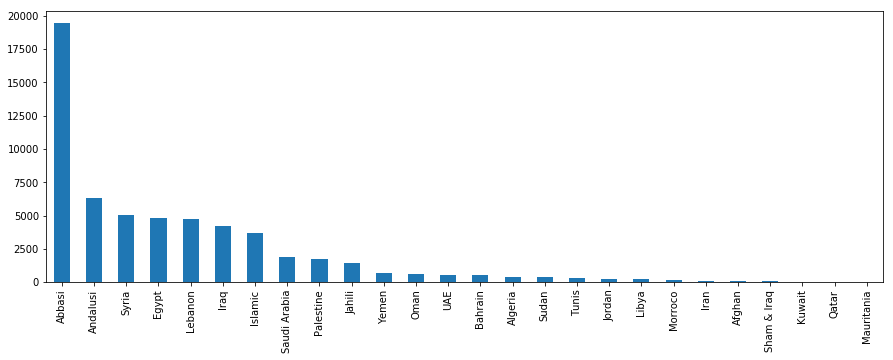

In [15]:
df_poems.poet_cat.value_counts().plot(kind='bar', figsize=(15, 5))
plt.xticks(np.arange(26), ('Abbasi','Andalusi', 'Syria', 'Egypt', 'Lebanon', 'Iraq', 'Islamic', 'Saudi Arabia', 
'Palestine','Jahili','Yemen','Oman','UAE','Bahrain', 'Algeria', 'Sudan', 'Tunis', 'Jordan', 'Libya', 'Morroco', 'Iran', 'Afghan'
                          ,'Sham & Iraq', 'Kuwait', 'Qatar', 'Mauritania'))
plt.show()

#### 4.2 Visualize top poets in the dataset

In [16]:
top_poets = df_poems.poet_name.value_counts()[df_poems.poet_name.value_counts() > 500]
print(top_poets)

ابن الرومي             2142
أبوالعلاء المعري       1593
ابن نباتة المصري       1534
جبران خليل جبران       1148
عبد الغني النابلسي     1115
البحتري                 959
محيي الدين  بن عربي     860
خليل مطران              857
أبو نواس                821
صفي الدين الحلي         811
ابن المعتز              762
الشريف الرضي            676
بشار بن برد             626
نزار قباني              605
الفرزدق                 601
الشريف المرتضى          570
أسامة بن منقذ           521
Name: poet_name, dtype: int64


## 5.  Feature Engineering

Classify 'poet_cat' column into two groups 'modern' and 'not_modern' 

* 'Modern' group includes the following poet_cat:

['شعراء العراق والشام','الأردن','العراق' ,'مصر' ,'سوريا' ,'لبنان' ,'فلسطين' ,'السعودية' ,'اليمن' ,'عمان','الإمارات', 'البحرين' ,'الجزائر','ليبيا','المغرب','الكويت' ,'قطر','موريتانيا', 'أفغانستان', 'إيران', 'السودان', 'تونس']

* 'not_Modern' group includes the following poet_cat:

['العصر العباسي', 'العصر الأندلسي', 'العصر الجاهلي', 'العصر الإسلامي']


In [17]:
df_poems.poet_cat.value_counts() 

العصر العباسي          19416
العصر الأندلسي          6296
سوريا                   5036
مصر                     4787
لبنان                   4760
العراق                  4247
العصر الإسلامي          3700
السعودية                1930
فلسطين                  1711
العصر الجاهلي           1461
اليمن                    699
عمان                     619
الإمارات                 563
البحرين                  554
الجزائر                  404
السودان                  374
تونس                     351
الأردن                   265
ليبيا                    240
المغرب                   202
إيران                     90
أفغانستان                 70
شعراء العراق والشام       68
الكويت                    54
موريتانيا                 15
قطر                       14
Name: poet_cat, dtype: int64

In [18]:
modern = ['شعراء العراق والشام','الأردن','العراق' ,'مصر' ,'سوريا' ,'لبنان' ,'فلسطين' ,'السعودية' ,'اليمن' ,'عمان',
          'الإمارات', 'البحرين' ,'الجزائر','ليبيا','المغرب','الكويت' ,'قطر',
          'موريتانيا', 'أفغانستان', 'إيران', 'السودان', 'تونس']

not_modern = ['العصر العباسي', 'العصر الأندلسي', 'العصر الجاهلي', 'العصر الإسلامي']

df_poems['modern'] = df_poems['poet_cat']

df_poems['modern'] = df_poems['modern'].replace(modern, 1)
df_poems['modern'] = df_poems['modern'].replace(not_modern, 0)



In [19]:
df_poems['modern'].value_counts()

0    30873
1    27053
Name: modern, dtype: int64

## 6.  Poetry Classification

We will build a classifier that can classify Arabic poetry into two classes: 

1. Modern
2. Not modern

#### 6.1 Prepare data

In [20]:
# Training Phase

X_train, X_test, y_train, y_test = train_test_split(df_poems['poem_text'], df_poems['modern'], test_size=0.3, 
                                                    random_state=0, stratify=df_poems['modern'])


In [21]:
Encoder = LabelEncoder()
Train_Y = Encoder.fit_transform(y_train)
Test_Y = Encoder.fit_transform(y_test)

In [22]:
Tfidf_vect = TfidfVectorizer(max_features=500, min_df=3, max_df=0.8)

Tfidf_vect.fit(df_poems['poem_text'])
Train_X_Tfidf = Tfidf_vect.transform(X_train)
Test_X_Tfidf = Tfidf_vect.transform(X_test)

/Users/nourainclub/anaconda3/lib/python3.6/site-packages/sklearn/feature_extraction/text.py:1089: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  if hasattr(X, 'dtype') and np.issubdtype(X.dtype, np.float):


In [24]:
print(Tfidf_vect.vocabulary_)

{'عين': 316, 'سحر': 203, 'او': 53, 'شرف': 227, 'راح': 174, 'عنه': 310, 'قمر': 372, 'بسم': 69, 'ورق': 453, 'كرم': 382, 'ضوء': 258, 'نهر': 436, 'كان': 376, 'نجم': 422, 'غرق': 320, 'اسي': 21, 'بحر': 62, 'فوق': 351, 'موت': 417, 'ظلم': 270, 'روح': 192, 'وحش': 448, 'عنق': 308, 'سمء': 213, 'طفل': 263, 'اذا': 12, 'سحب': 202, 'شرب': 225, 'غيم': 328, 'قطر': 367, 'مطر': 412, 'صمت': 251, 'علي': 303, 'شجر': 224, 'دمع': 166, 'ثقل': 94, 'قبل': 358, 'ان': 45, 'بان': 60, 'افق': 24, 'فلم': 348, 'سءل': 199, 'قال': 355, 'تعد': 89, 'وان': 443, 'رفق': 188, 'انه': 50, 'جنب': 109, 'ترب': 84, 'جمع': 107, 'قدر': 360, 'نثر': 420, 'علم': 302, 'اي': 55, 'حزن': 127, 'وكف': 467, 'شعر': 230, 'وحد': 447, 'بلا': 75, 'عبر': 274, 'برق': 68, 'عرق': 288, 'شرق': 228, 'الل': 31, 'عليها': 304, 'ردي': 182, 'رجع': 178, 'كنه': 389, 'سمع': 216, 'جبل': 97, 'حتي': 117, 'رجل': 179, 'ترك': 86, 'ريح': 195, 'اثر': 5, 'هجر': 440, 'نشد': 427, 'وفي': 460, 'غرب': 319, 'حجر': 119, 'تدر': 83, 'حول': 142, 'بشر': 70, 'وكم': 469, 'ليل': 402, 'ر

#### 6.2 Plot Features

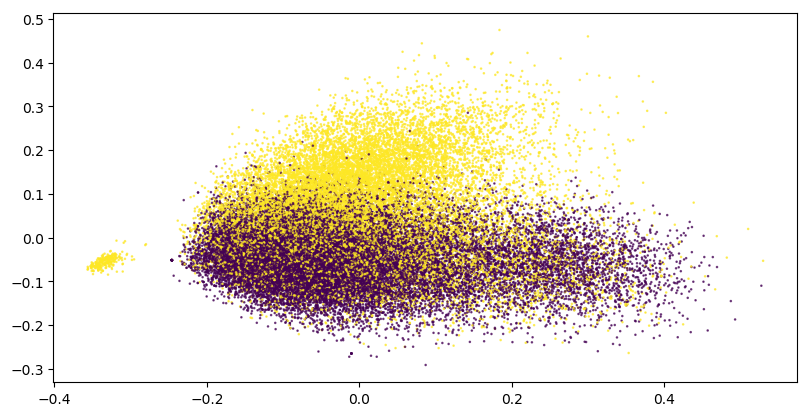

In [26]:
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

plt.figure(figsize=plt.figaspect(0.5))   # figure size
plt.rcParams.update(plt.rcParamsDefault) # the default parameters

pca = PCA(n_components=2)
pca.fit(Train_X_Tfidf.todense())
vals1 = pca.transform(Train_X_Tfidf.todense())

#plt.legend(['Modern', 'Not modern'])
plt.scatter(vals1[:,0], vals1[:,1], c = Train_Y, s =0.7, alpha= 0.7)
plt.show()

#### 6.2 Classification using Naive Bayes 

In [27]:
from sklearn.naive_bayes import GaussianNB

#Create a Gaussian Classifier
nb_model = GaussianNB()

# Train the model using the training sets
nb_model.fit(Train_X_Tfidf.todense(), Train_Y)

#Predict Output
predictions_NB= nb_model.predict(Test_X_Tfidf.todense())
print ("Naive Bayes Accuracy Score -> ",accuracy_score(predictions_NB, Test_Y) * 100)

Naive Bayes Accuracy Score ->  78.06421912763264


#### 6.3 Classification using Logistic Regression

In [28]:
from sklearn.linear_model import LogisticRegression

LR_model = LogisticRegression()
LR_model.fit(Train_X_Tfidf.todense(), Train_Y)
predictions_LR = LR_model.predict(Test_X_Tfidf.todense())

print ("Logistic Regression Accuracy Score -> ",accuracy_score(predictions_LR, Test_Y) * 100)

Logistic Regression Accuracy Score ->  83.04753136149155


In [29]:
#do a 10 fold cross-validation 
results_LR = cross_val_score(LR_model, Train_X_Tfidf.todense(), Train_Y, cv=10)
print("\n10-fold cross-validation:")
print(results_LR)

print("The average accuracy of the Logistic Regression classifier is :", np.mean(results_LR)* 100)


10-fold cross-validation:
[0.81854043 0.82194821 0.83008631 0.8298397  0.82811344 0.82762022
 0.82589396 0.81697089 0.82634435 0.8325111 ]
The average accuracy of the Logistic Regression classifier is : 82.57868627844742


In [31]:
print("\nConfusion matrix of the Logistic Regression classifier:")
predicted_LR = LR_model.predict(Test_X_Tfidf.todense())
print(confusion_matrix(Test_Y,predicted_LR))


Confusion matrix of the Logistic Regression classifier:
[[8201 1061]
 [1885 6231]]


In [32]:
print("\nClassification_report of Logistic Regression classifier:")
print(classification_report(Test_Y,predicted_LR))
print("----------------------------------------------------------------------------")


Classification_report of Logistic Regression classifier:
             precision    recall  f1-score   support

          0       0.81      0.89      0.85      9262
          1       0.85      0.77      0.81      8116

avg / total       0.83      0.83      0.83     17378

----------------------------------------------------------------------------


In [33]:
# calculate the fpr and tpr for all thresholds of the classification
probs = LR_model.predict_proba(Test_X_Tfidf.todense())
preds = probs[:,1]

fpr, tpr, threshold =  roc_curve(Test_Y, preds)
roc_auc = auc(fpr, tpr)

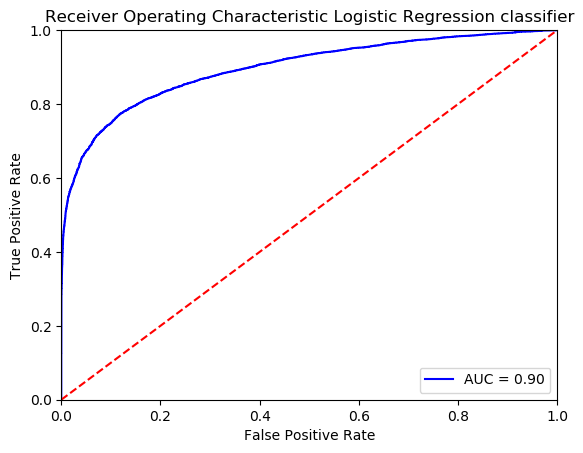

In [34]:
# plot the AUC
plt.title('Receiver Operating Characteristic Logistic Regression classifier')
plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc)
plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()